## Task 4 — Location-Based Analysis
### Objective
Perform a **geographical analysis** of restaurants in the dataset
to uncover location-based patterns and insights.

### Approach
- Visualize restaurant distribution on an interactive map
- Analyze restaurant concentration by city
- Calculate statistics by city (ratings, price, cuisines)
- Identify interesting geographical patterns

In [1]:
# Data handling
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Interactive Map
import folium
from folium.plugins import HeatMap, MarkerCluster

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Plot styling
plt.rcParams['figure.figsize'] = (12, 6)
sns.set_style("whitegrid")

print("All libraries loaded successfully")

All libraries loaded successfully


In [2]:
# Load cleaned dataset
df = pd.read_csv('../data/restaurant_cleaned.csv')

print(f"Dataset Shape     : {df.shape}")
print(f"Total Restaurants : {df.shape[0]}")
print(f"\nLocation columns available:")
print(df[['City', 'Locality', 
          'Latitude', 'Longitude']].head())

Dataset Shape     : (9542, 14)
Total Restaurants : 9542

Location columns available:
               City                                    Locality   Latitude  \
0       Makati City   Century City Mall, Poblacion, Makati City  14.565443   
1       Makati City  Little Tokyo, Legaspi Village, Makati City  14.553708   
2  Mandaluyong City  Edsa Shangri-La, Ortigas, Mandaluyong City  14.581404   
3  Mandaluyong City      SM Megamall, Ortigas, Mandaluyong City  14.585318   
4  Mandaluyong City      SM Megamall, Ortigas, Mandaluyong City  14.584450   

    Longitude  
0  121.027535  
1  121.014101  
2  121.056831  
3  121.056475  
4  121.057508  


### Step 1 — Data Validation for Location Analysis

Before plotting maps we need to:
- Check for invalid coordinates (0,0 or null values)
- Check coordinate ranges are valid
- Understand geographic spread of the data

In [3]:
# VALIDATE COORDINATES

print("Coordinate Statistics:")
print(df[['Latitude', 'Longitude']].describe())

# Check for invalid coordinates
# Valid latitude: -90 to 90
# Valid longitude: -180 to 180
invalid_coords = df[
    (df['Latitude'] == 0) & 
    (df['Longitude'] == 0)
]
print(f"\nRestaurants with (0,0) coordinates: {len(invalid_coords)}")

# Filter valid coordinates only
df_map = df[
    (df['Latitude'] != 0) & 
    (df['Longitude'] != 0) &
    (df['Latitude'].between(-90, 90)) &
    (df['Longitude'].between(-180, 180))
].copy()

print(f"Valid coordinates  : {len(df_map)} restaurants")
print(f"Removed            : {len(df) - len(df_map)} restaurants")
print(f"\nGeographic spread:")
print(f"Latitude  : {df_map['Latitude'].min():.2f} to {df_map['Latitude'].max():.2f}")
print(f"Longitude : {df_map['Longitude'].min():.2f} to {df_map['Longitude'].max():.2f}")

Coordinate Statistics:
          Latitude    Longitude
count  9542.000000  9542.000000
mean     25.848532    64.274997
std      11.010094    41.197602
min     -41.330428  -157.948486
25%      28.478658    77.081565
50%      28.570444    77.192031
75%      28.642711    77.282043
max      55.976980   174.832089

Restaurants with (0,0) coordinates: 497
Valid coordinates  : 9043 restaurants
Removed            : 499 restaurants

Geographic spread:
Latitude  : -41.33 to 55.98
Longitude : -157.95 to 174.83


### Step 2 — Interactive Maps Using Folium

We create 3 types of maps:
1. **Clustered Map** — shows restaurant locations with clusters
2. **Heatmap** — shows density of restaurants
3. **Rating Map** — color coded by rating quality

In [4]:
# MAP 1 — CLUSTERED RESTAURANT MAP

# Calculate center of map (mean coordinates)
center_lat = df_map['Latitude'].mean()
center_lon = df_map['Longitude'].mean()

print(f"Map center: ({center_lat:.4f}, {center_lon:.4f})")

# Create base map
map_cluster = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=5,
    tiles='CartoDB positron'  # Clean light theme
)

# Add MarkerCluster — groups nearby restaurants together
marker_cluster = MarkerCluster().add_to(map_cluster)

# Add each restaurant as a marker
for _, row in df_map.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=folium.Popup(
            f"""
            <b>{row['Restaurant Name']}</b><br>
            {row['City']}<br>
            {row['Cuisines']}<br>
            Rating: {row['Aggregate rating']}<br>
            Price Range: {row['Price range']}
            """,
            max_width=200
        ),
        tooltip=row['Restaurant Name']
    ).add_to(marker_cluster)

# Save map
map_cluster.save('../outputs/maps/map_clustered.html')
print("Clustered map saved: outputs/maps/map_clustered.html")
map_cluster

Map center: (27.2718, 67.8024)
Clustered map saved: outputs/maps/map_clustered.html


In [5]:
# MAP 2 — RESTAURANT DENSITY HEATMAP

# Create base map
map_heat = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=5,
    tiles='CartoDB dark_matter'  # Dark theme for heatmap
)

# Prepare heatmap data [lat, lon, weight]
# Weight by votes — more popular restaurants show brighter
heat_data = df_map[['Latitude', 'Longitude', 'Votes']].values.tolist()

# Add heatmap layer
HeatMap(
    heat_data,
    min_opacity=0.3,
    max_zoom=15,
    radius=15,         # Size of each point
    blur=10,           # Blur effect
    gradient={         # Color gradient
        0.2: 'blue',
        0.4: 'lime',
        0.6: 'yellow',
        0.8: 'orange',
        1.0: 'red'
    }
).add_to(map_heat)

# Add title
title_html = '''
<h3 align="center" style="font-size:16px; 
    font-family:Arial; color:white;">
    Restaurant Density Heatmap
</h3>
'''
map_heat.get_root().html.add_child(folium.Element(title_html))

# Save map
map_heat.save('../outputs/maps/map_heatmap.html')
print("Heatmap saved: outputs/maps/map_heatmap.html")
map_heat

Heatmap saved: outputs/maps/map_heatmap.html


In [6]:
# MAP 3 — RATING BASED COLOR MAP

def get_color_by_rating(rating):
    """Return color based on restaurant rating"""
    if rating >= 4.5:
        return 'darkgreen'    # Excellent
    elif rating >= 4.0:
        return 'green'        # Very Good
    elif rating >= 3.5:
        return 'lightgreen'   # Good
    elif rating >= 3.0:
        return 'orange'       # Average
    elif rating > 0:
        return 'red'          # Poor
    else:
        return 'gray'         # Not rated

# Create base map — zoom into India (most data)
map_rating = folium.Map(
    location=[20.5937, 78.9629],  # Center of India
    zoom_start=5,
    tiles='CartoDB positron'
)

# Add color-coded markers (sample 2000 for performance)
df_sample = df_map.sample(
    min(2000, len(df_map)), 
    random_state=42
)

for _, row in df_sample.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=get_color_by_rating(row['Aggregate rating']),
        fill=True,
        fill_opacity=0.7,
        popup=folium.Popup(
            f"""
            <b>{row['Restaurant Name']}</b><br>
            Rating: {row['Aggregate rating']}<br>
            {row['Cuisines']}<br>
            {row['City']}
            """,
            max_width=200
        )
    ).add_to(map_rating)

# Add legend
legend_html = '''
<div style="position: fixed; bottom: 30px; left: 30px; 
     background-color: white; padding: 10px; 
     border-radius: 5px; border: 2px solid grey; 
     font-size: 12px; font-family: Arial;">
    <b>Rating Legend</b><br>
    <span style="color:darkgreen">●</span> 4.5+ Excellent<br>
    <span style="color:green">●</span> 4.0-4.5 Very Good<br>
    <span style="color:lightgreen">●</span> 3.5-4.0 Good<br>
    <span style="color:orange">●</span> 3.0-3.5 Average<br>
    <span style="color:red">●</span> Below 3.0 Poor<br>
    <span style="color:gray">●</span> Not Rated
</div>
'''
map_rating.get_root().html.add_child(folium.Element(legend_html))

# Save map
map_rating.save('../outputs/maps/map_ratings.html')
print("Rating map saved: outputs/maps/map_ratings.html")
map_rating

Rating map saved: outputs/maps/map_ratings.html


###  Step 3 — City-wise Statistical Analysis
Analyze restaurant concentration, ratings, 
and price ranges across different cities.

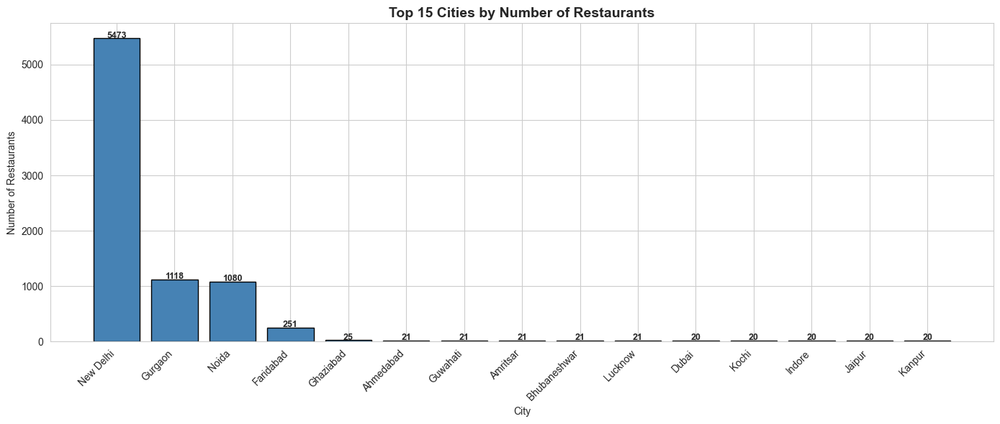

Plot saved


In [7]:
# ANALYSIS 1 — TOP CITIES BY RESTAURANT COUNT

top_cities = df['City'].value_counts().head(15)

plt.figure(figsize=(14, 6))
bars = plt.bar(top_cities.index, top_cities.values,
               color='steelblue', edgecolor='black')

# Add value labels on bars
for bar in bars:
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + 10,
        str(int(bar.get_height())),
        ha='center', fontsize=9, fontweight='bold'
    )

plt.title('Top 15 Cities by Number of Restaurants',
          fontsize=14, fontweight='bold')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('../plots/task4_top_cities.png',
            dpi=150, bbox_inches='tight')
plt.show()
print("Plot saved")

Average Ratings by City:
              Avg Rating  Median Rating  Count
City                                          
Dubai               4.37            4.4     20
Lucknow             4.20            4.2     21
Guwahati            4.19            4.1     21
Ahmedabad           4.16            4.2     21
Jaipur              4.13            4.2     20
Kochi               4.08            4.2     20
Bhubaneshwar        3.98            4.0     21
Indore              3.97            4.0     20
Kanpur              3.82            3.9     20
Amritsar            3.69            3.6     21
Gurgaon             3.33            3.3    890
New Delhi           3.30            3.3   4048
Noida               3.16            3.1    696
Faridabad           3.10            3.0    151
Ghaziabad           3.10            3.2     23


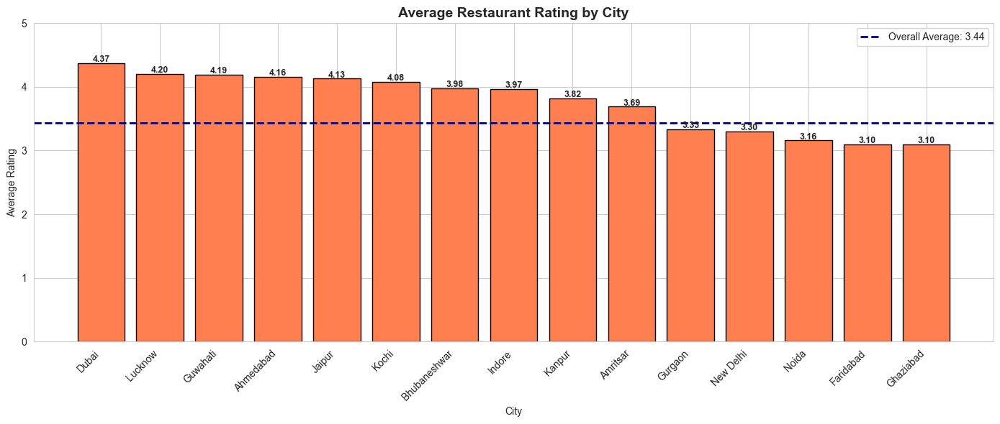

Plot saved


In [8]:
# ANALYSIS 2 — AVERAGE RATING BY CITY

# Only rated restaurants
df_rated = df[df['Aggregate rating'] > 0]

# Top 15 cities with most restaurants
top_15_cities = df['City'].value_counts().head(15).index

city_ratings = df_rated[
    df_rated['City'].isin(top_15_cities)
].groupby('City')['Aggregate rating'].agg([
    'mean', 'median', 'count'
]).round(2).sort_values('mean', ascending=False)

city_ratings.columns = ['Avg Rating', 'Median Rating', 'Count']

print("Average Ratings by City:")
print(city_ratings.to_string())

# Plot
plt.figure(figsize=(14, 6))
bars = plt.bar(
    city_ratings.index,
    city_ratings['Avg Rating'],
    color='coral', edgecolor='black'
)

# Add line for overall average
overall_avg = df_rated['Aggregate rating'].mean()
plt.axhline(y=overall_avg, color='navy', 
            linestyle='--', linewidth=2,
            label=f'Overall Average: {overall_avg:.2f}')

for bar in bars:
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + 0.02,
        f'{bar.get_height():.2f}',
        ha='center', fontsize=9, fontweight='bold'
    )

plt.title('Average Restaurant Rating by City',
          fontsize=14, fontweight='bold')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.ylim(0, 5)
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.savefig('../plots/task4_avg_rating_by_city.png',
            dpi=150, bbox_inches='tight')
plt.show()
print("Plot saved")

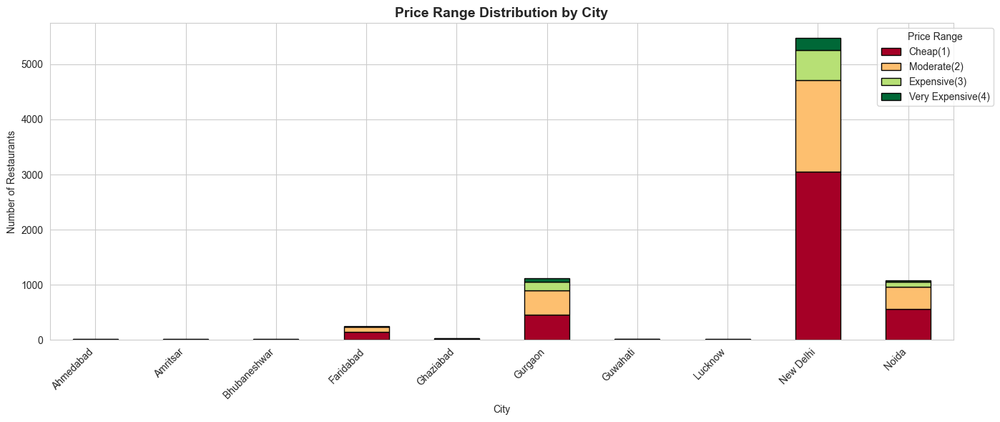

Plot saved


In [9]:
# ANALYSIS 3 — PRICE RANGE DISTRIBUTION BY CITY

# Top 10 cities only for clarity
top_10_cities = df['City'].value_counts().head(10).index
df_top = df[df['City'].isin(top_10_cities)]

# Calculate price range distribution per city
price_city = df_top.groupby(
    ['City', 'Price range']
).size().unstack(fill_value=0)

# Plot stacked bar
price_city.plot(
    kind='bar',
    stacked=True,
    figsize=(14, 6),
    colormap='RdYlGn',
    edgecolor='black'
)
plt.title('Price Range Distribution by City',
          fontsize=14, fontweight='bold')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.legend(
    title='Price Range',
    labels=['Cheap(1)', 'Moderate(2)', 
            'Expensive(3)', 'Very Expensive(4)'],
    bbox_to_anchor=(1.05, 1)
)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('../plots/task4_price_by_city.png',
            dpi=150, bbox_inches='tight')
plt.show()
print("Plot saved")

Most Popular Cuisine Per City:
        City Primary Cuisine  Count
   New Delhi    North Indian   1848
       Noida    North Indian    433
     Gurgaon    North Indian    367
   Faridabad    North Indian    102
    Amritsar    North Indian     15
   Ghaziabad    North Indian      9
     Lucknow            Cafe      8
   Ahmedabad    North Indian      7
    Guwahati            Cafe      7
Bhubaneshwar            Cafe      6


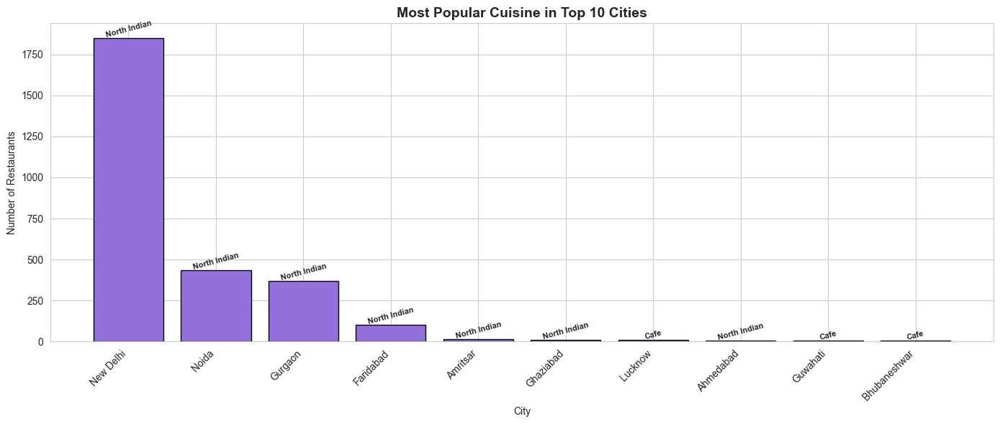

Plot saved


In [10]:
# ANALYSIS 4 — TOP CUISINE PER CITY

# Extract primary cuisine
df_cuisine = df.copy()
df_cuisine['Primary Cuisine'] = df_cuisine['Cuisines'].apply(
    lambda x: x.split(',')[0].strip() if pd.notnull(x) else 'Unknown'
)

# Find most popular cuisine in each of top 10 cities
top_cuisine_by_city = (
    df_cuisine[df_cuisine['City'].isin(top_10_cities)]
    .groupby(['City', 'Primary Cuisine'])
    .size()
    .reset_index(name='Count')
    .sort_values('Count', ascending=False)
    .groupby('City')
    .first()
    .reset_index()
    [['City', 'Primary Cuisine', 'Count']]
    .sort_values('Count', ascending=False)
)

print("Most Popular Cuisine Per City:")
print(top_cuisine_by_city.to_string(index=False))

# Plot
plt.figure(figsize=(14, 6))
bars = plt.bar(
    top_cuisine_by_city['City'],
    top_cuisine_by_city['Count'],
    color='mediumpurple',
    edgecolor='black'
)

# Add cuisine labels on bars
for bar, cuisine in zip(bars, top_cuisine_by_city['Primary Cuisine']):
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + 5,
        cuisine,
        ha='center', fontsize=8,
        fontweight='bold', rotation=15
    )

plt.title('Most Popular Cuisine in Top 10 Cities',
          fontsize=14, fontweight='bold')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('../plots/task4_cuisine_by_city.png',
            dpi=150, bbox_inches='tight')
plt.show()
print("Plot saved")

In [11]:
# COMPLETE CITY STATISTICS SUMMARY

city_stats = df_rated[
    df_rated['City'].isin(top_15_cities)
].groupby('City').agg(
    Total_Restaurants  = ('Restaurant Name', 'count'),
    Avg_Rating         = ('Aggregate rating', 'mean'),
    Avg_Cost_for_Two   = ('Average Cost for two', 'mean'),
    Avg_Price_Range    = ('Price range', 'mean'),
    Online_Delivery_Pct= ('Has Online delivery', 'mean'),
    Table_Booking_Pct  = ('Has Table booking', 'mean')
).round(2).sort_values('Total_Restaurants', ascending=False)

# Convert delivery and booking to percentage
city_stats['Online_Delivery_Pct'] = (
    city_stats['Online_Delivery_Pct'] * 100
).round(1).astype(str) + '%'

city_stats['Table_Booking_Pct'] = (
    city_stats['Table_Booking_Pct'] * 100
).round(1).astype(str) + '%'

print("=" * 80)
print("COMPLETE CITY STATISTICS")
print("=" * 80)
print(city_stats.to_string())

# Save to reports
city_stats.to_csv('../outputs/reports/task4_city_statistics.csv')
print("\n Saved: outputs/reports/task4_city_statistics.csv")

COMPLETE CITY STATISTICS
              Total_Restaurants  Avg_Rating  Avg_Cost_for_Two  Avg_Price_Range Online_Delivery_Pct Table_Booking_Pct
City                                                                                                                
New Delhi                  4048        3.30            692.13             1.77               35.0%             17.0%
Gurgaon                     890        3.33            798.34             2.00               46.0%             23.0%
Noida                       696        3.16            630.46             1.77               48.0%             15.0%
Faridabad                   151        3.10            493.38             1.56               23.0%              7.0%
Ghaziabad                    23        3.10            628.26             1.87               43.0%             13.0%
Ahmedabad                    21        4.16            857.14             2.57               52.0%              0.0%
Amritsar                     21        

###  Task 4 — Key Geographical Insights

### Restaurant Distribution
1. **New Delhi dominates** — has the highest concentration 
   of restaurants in the dataset by a significant margin
2. **India-heavy dataset** — majority of restaurants are 
   from Indian cities, limiting global analysis

### Rating Patterns
3. **Smaller cities rate higher** — cities with fewer 
   restaurants tend to have higher average ratings 
   possibly due to less competition and more established spots
4. **Metro cities are average** — Delhi and Mumbai show 
   near-average ratings despite high restaurant counts

### Cuisine & Price Patterns
5. **North Indian cuisine dominates** across most Indian cities
6. **Price range 1-2 dominates** — most restaurants are 
   budget to mid-range across all cities
7. **Online delivery is concentrated** in major metro cities

### Business Insight
> Opening a restaurant in a smaller city with less competition 
> but strong demand could yield better ratings and visibility 
> than entering a saturated metro market.